In [2]:
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import ast
import shutil
import random 

In [3]:
train_images = "../input/table-tennis-ball-position-detection-dataset/openttgames/openttgames/images/train/"
test_images = "../input/table-tennis-ball-position-detection-dataset/openttgames/openttgames/images/test/"
train_labels = "../input/table-tennis-ball-position-detection-dataset/openttgames/openttgames/labels/train/"
test_labels = "../input/table-tennis-ball-position-detection-dataset/openttgames/openttgames/labels/test/"

image_name = "100.png"
image = cv2.imread(train_images + image_name, cv2.IMREAD_COLOR)

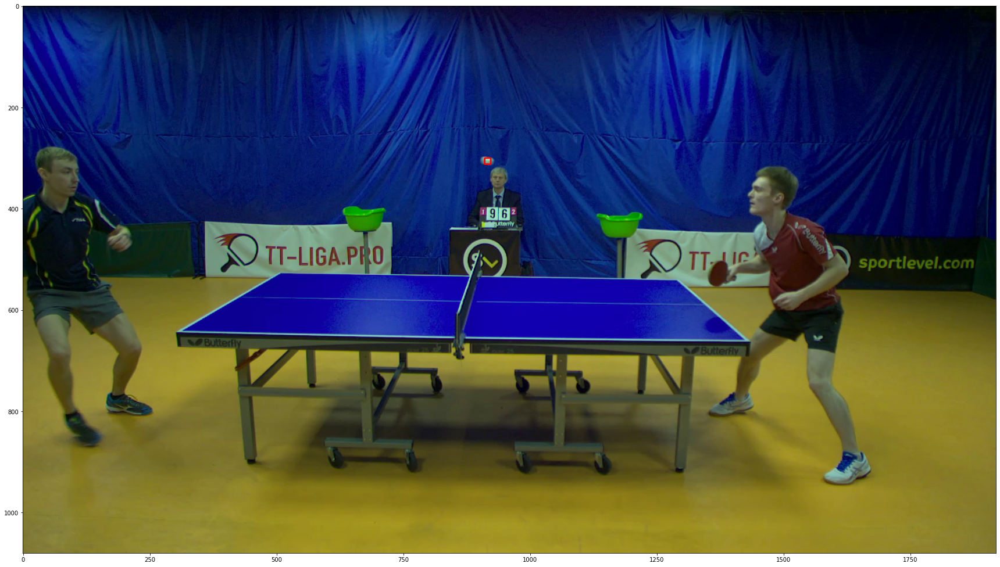

In [4]:
# YOLO format <object-class> <x> <y> <width> <height>
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

width = image_rgb.shape[1]
height = image_rgb.shape[0]

with open(train_labels + image_name[:-4] + ".txt") as label:
    data = map(float, label.readline().split())
    list_of_yolo_data = list(data)

if list_of_yolo_data:
    # For rectangle
    x1 = int(width * list_of_yolo_data[1] - width * list_of_yolo_data[3] / 2)
    y1 = int(height * list_of_yolo_data[2] - height * list_of_yolo_data[4] / 2)
    x2 = int(width * list_of_yolo_data[1] + width * list_of_yolo_data[3] / 2)
    y2 = int(height * list_of_yolo_data[2] + height * list_of_yolo_data[4] / 2)
    cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)
   

fig, ax = plt.subplots(figsize=(30,30))
ax.imshow(image_rgb)

# **YOLO v5 installation and preparing**
**Import of important libraries and methods**

In [5]:
import torch
from IPython.display import Image, clear_output

clear_output()
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")


Setup complete. Using torch 1.11.0 (Tesla P100-PCIE-16GB)


In [6]:
# clone repo
!git clone https://github.com/ultralytics/yolov5.git  

# change the working directory to yolov5
%cd yolov5
os.chdir('/kaggle/working/yolov5')


# install dependencies
%pip install -qr requirements.txt 

# Change the working directory back to /kaggle/working/
os.chdir('/kaggle/working/')

!pwd

Cloning into 'yolov5'...
remote: Enumerating objects: 12034, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 12034 (delta 0), reused 1 (delta 0), pack-reused 12029
Receiving objects: 100% (12034/12034), 12.46 MiB | 21.55 MiB/s, done.
Resolving deltas: 100% (8274/8274), done.
/kaggle/working/yolov5
Note: you may need to restart the kernel to use updated packages.
/kaggle/working


In [7]:
os.chdir('/kaggle/working/yolov5')

# Create a new directory (this is happening inside the yolov5 directory)

base_dir = 'base_dir'
os.mkdir(base_dir)

# images
images = os.path.join(base_dir, 'images')
os.mkdir(images)

# labels
labels = os.path.join(base_dir, 'labels')
os.mkdir(labels)

# Inside each folder we create seperate folders for each class

# create new folders inside images
train = os.path.join(images, 'train')
os.mkdir(train)
test = os.path.join(images, 'test')
os.mkdir(test)


# create new folders inside labels
train = os.path.join(labels, 'train')
os.mkdir(train)
test = os.path.join(labels, 'test')
os.mkdir(test)

# Display the folder structure

!tree base_dir

base_dir
├── images
│   ├── test
│   └── train
└── labels
    ├── test
    └── train

6 directories, 0 files


In [8]:
!pwd

/kaggle/working/yolov5


In [9]:
test_image_files = os.listdir('../' + test_images)

In [11]:
for i in test_image_files:
    shutil.copyfile('../' + test_images + i, "/kaggle/working/yolov5/base_dir/images/" + i)

In [12]:
# Install W&B 
!pip install -q --upgrade wandb

# Login 
import wandb
wandb.login()

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
allennlp 2.10.0 requires protobuf==3.20.0, but you have protobuf 3.19.4 which is incompatible.
allennlp 2.10.0 requires wandb<0.13.0,>=0.10.0, but you have wandb 0.13.2 which is incompatible.


wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [13]:
classes = ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light',
        'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
        'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee',
        'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard',
        'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
        'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
        'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
        'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear']

print(classes[32])

sports ball


In [14]:
!python detect.py --weights yolov5s.pt \
                  --conf 0.25 \
                  --classes 32 \
                  --save-txt \
                  --source /kaggle/working/yolov5/base_dir/images \
                  --project yolov5_using_pt_model

detect: weights=['yolov5s.pt'], source=/kaggle/working/yolov5/base_dir/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=[32], agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5_using_pt_model, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.2-61-gffbce38 Python-3.7.12 torch-1.11.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

100%|██████████████████████████████████████| 14.1M/14.1M [00:00<00:00, 37.5MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/2471 /kaggle/working/yolov5/base_dir/images/1000_3.png: 384x640 (no detections), 9.8ms
image 2/2471 /kaggle/working/yolov5/base_dir/images/1001_3.png: 384x640 (no detections), 6.8ms
image 3/2471 /kaggle/working/yolov5/base_dir/images/1002_3.png: 384x640 (no detections

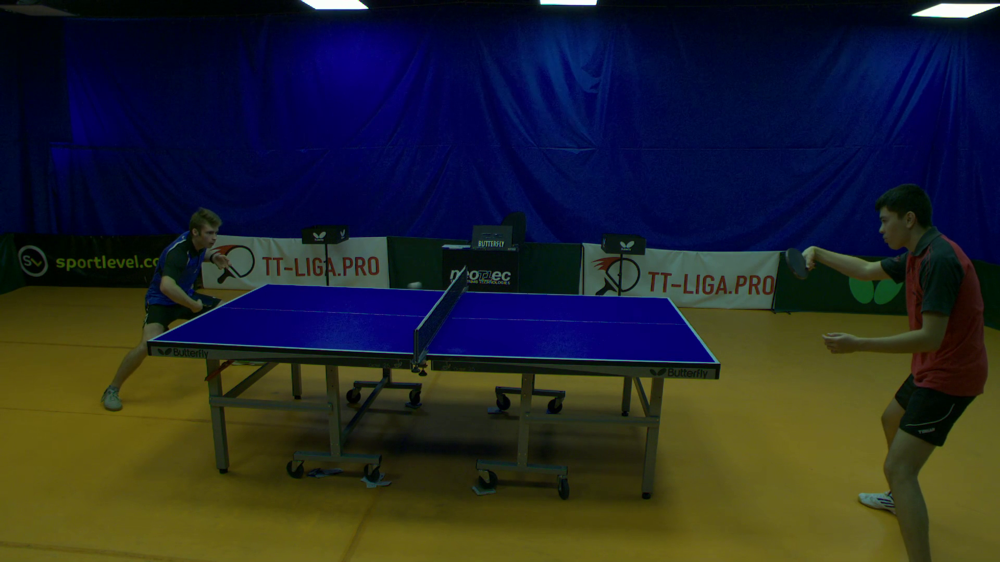

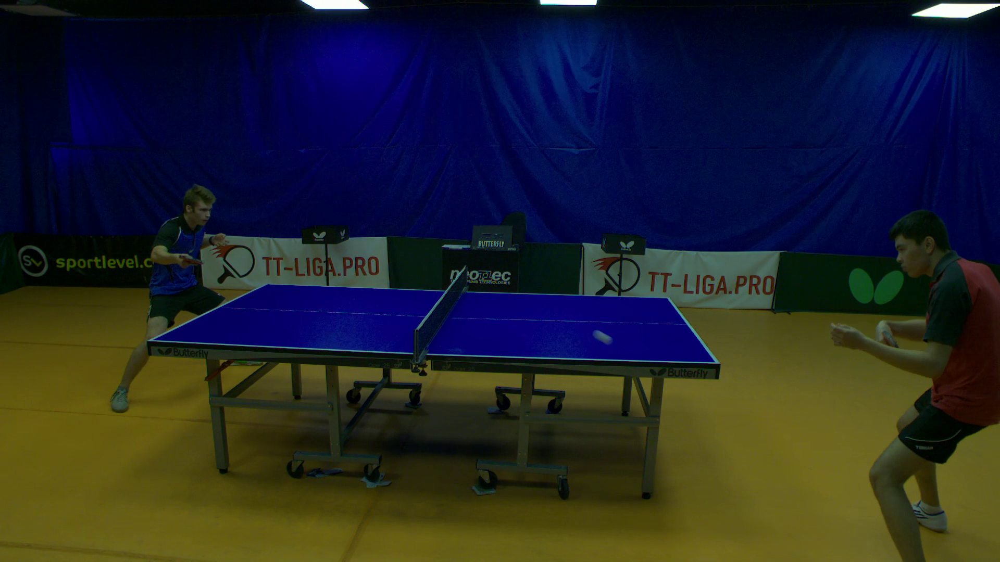

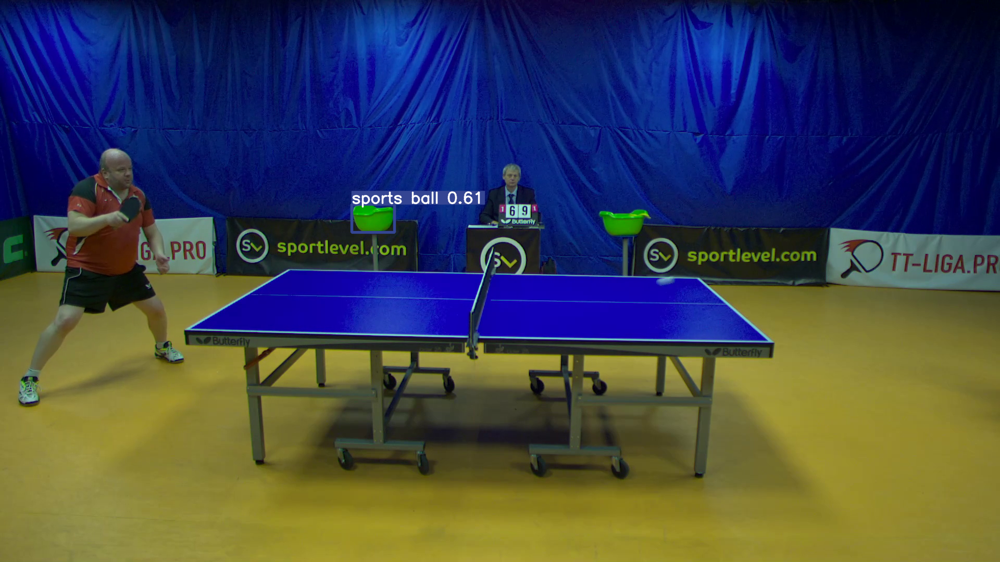

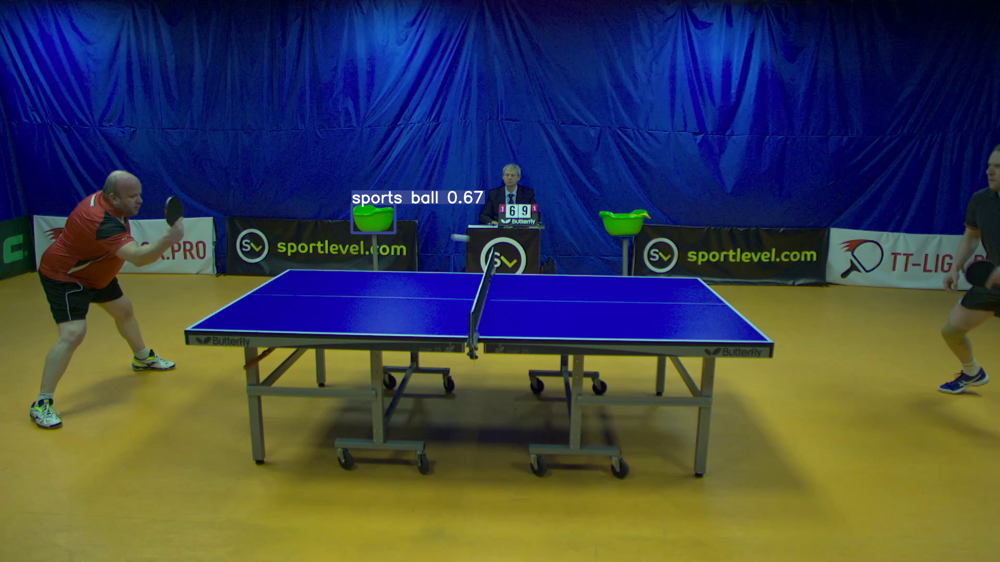

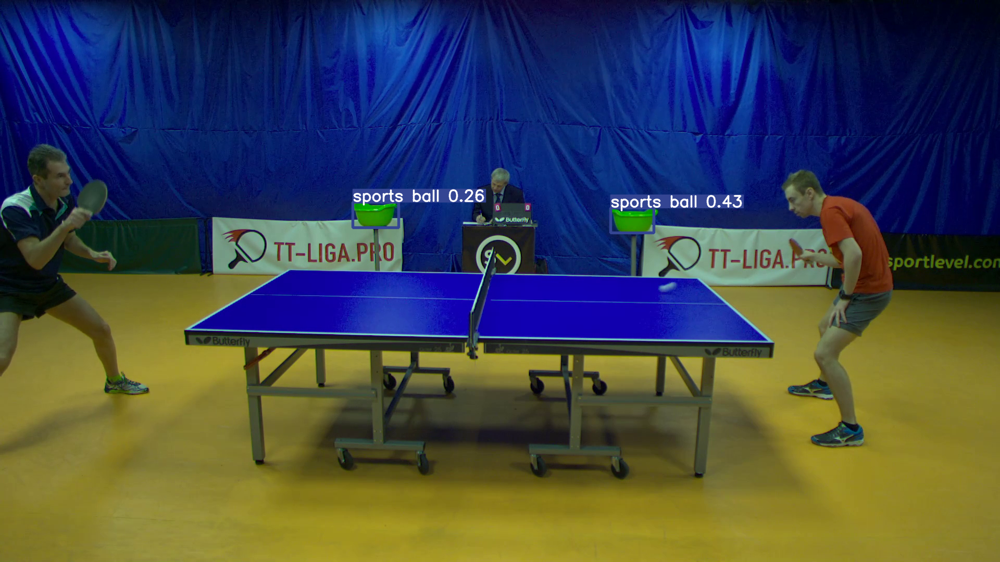

In [15]:
import glob

for images in glob.glob('yolov5_using_pt_model/exp/*.png')[200:205]:
    display(Image(filename=images))

In [ ]:
import shutil
shutil.make_archive("result", 'zip', "runs/detect/exp2/labels" )

In [ ]:
# Save files
import shutil
shutil.make_archive("weights", 'zip', "table-tennis-yolov5/weights" )